In [1]:
%matplotlib inline

In [2]:
import matplotlib.pylab as plt
import numpy as np
import json
import pandas as pd

## Learning Rate Sensitivity MNIST

In [20]:
def buildOptimizationDictLC(optimizers, learning_rates, epoch):
    opt_dict = {}
    for optimizer in optimizers:
        for lr in learning_rates:
            key = "{opt}_{lr}_{epoch}".format(opt=optimizer,lr=lr,epoch=epoch)
            opt_dict[key] = pd.read_json("output/MNIST/{opt}_{lr}_{epoch}_history.json".format(opt=optimizer,lr=lr,epoch=epoch))
    return opt_dict

def plotLearningRateC(optimizers, learning_rates, epoch):
    opt_dict = buildOptimizationDictLC(optimizers, learning_rates, epoch)
    plt.figure(figsize=(20,4))
    for i in range(4):
        plt.subplot(1,4,i+1)
        key = ['accuracy','loss', 'val_accuracy', 'val_loss', ][i]
        title = ['Training Accuracy on MNIST','Training Loss on MNIST', 'Validation Accuracy on MNIST', 'Validation Loss on MNIST'][i]
        for opt in list(opt_dict.keys()):
            epoch_len = -1 * (int(len(str(epoch))) + 1)
            plt.plot(range(epoch), opt_dict[opt][key], label=opt[:epoch_len])
        plt.legend()
        plt.title(title)
    plt.suptitle(str(optimizers[0]) + " (Epoch= " + str(epoch) + ")")
    plt.plot()

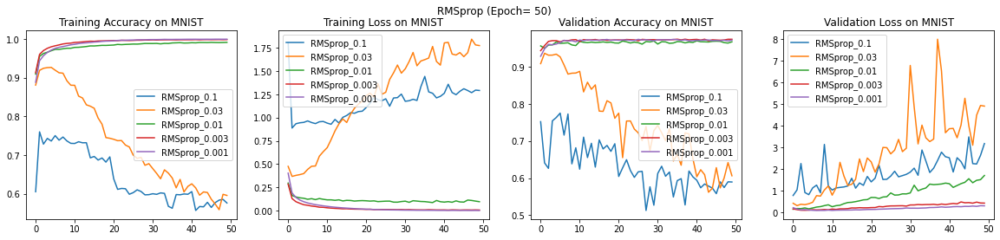

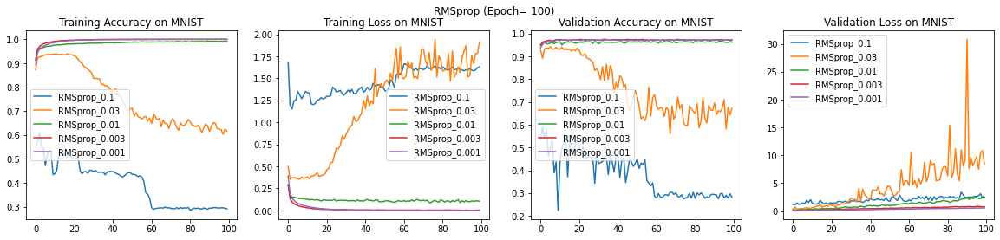

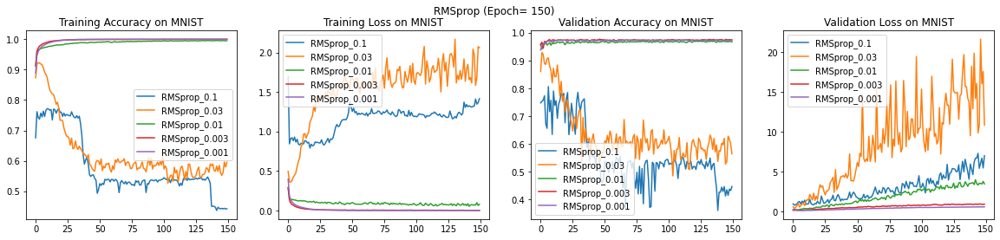

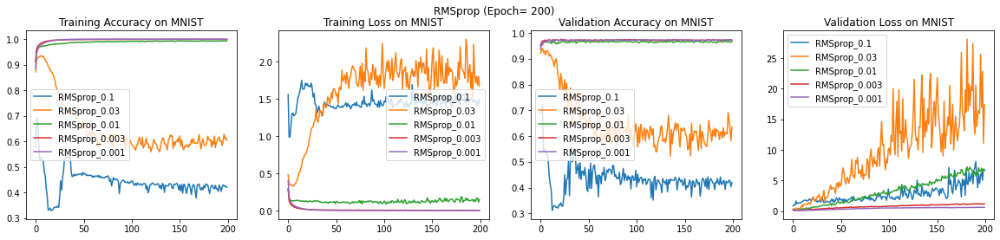

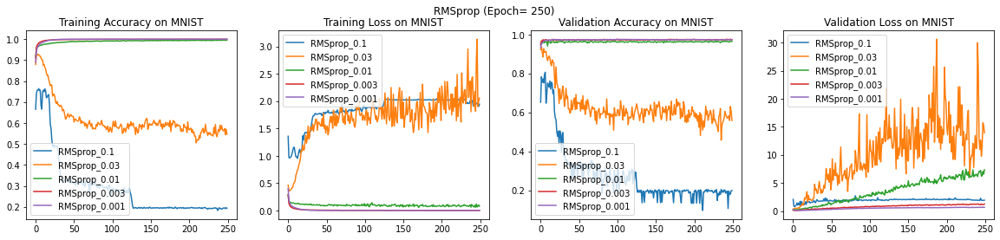

...

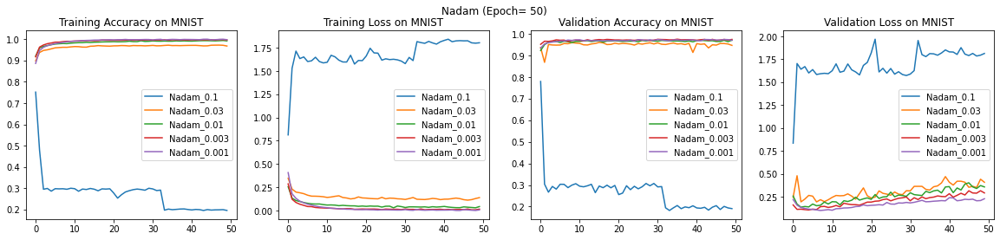

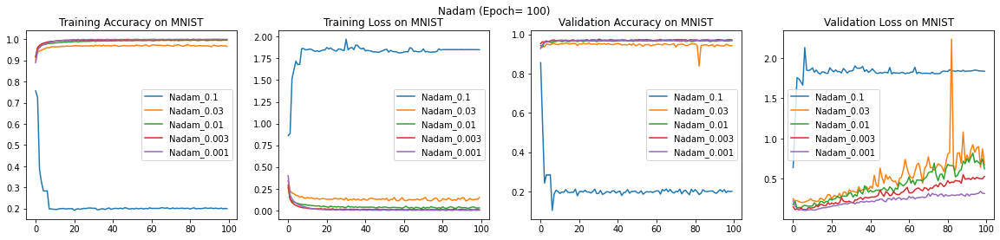

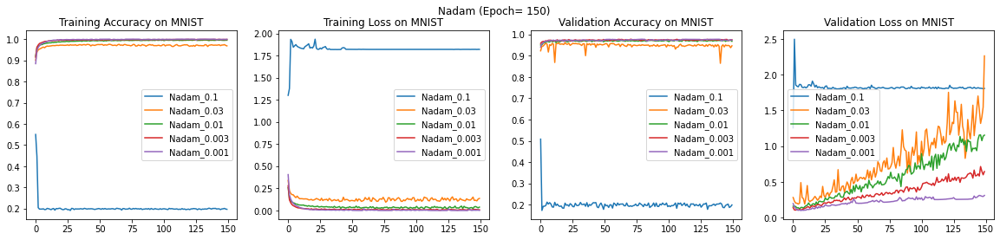

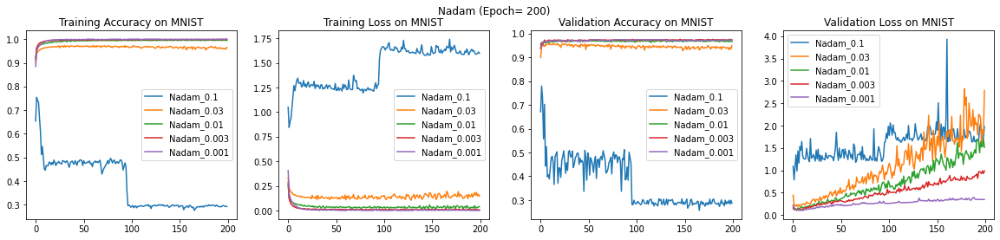

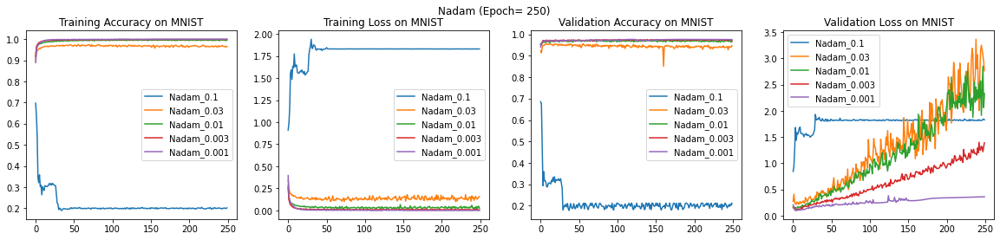

In [21]:
optimizers = ['RMSprop', 'Adam', 'SGD', 'Adagrad', 'Adadelta', 'Adamax', 'Nadam']
learning_rates = [0.1, 0.03, 0.01, 0.003, 0.001]
epochs = [50,100, 150, 200, 250]
for optimizer in optimizers:
    for epoch in epochs:
        plotLearningRateC([optimizer], learning_rates, epoch)


## Learning Rate Sensitivity CIFAR-10

In [3]:
def buildOptimizationDictLC(optimizers, learning_rates, epoch):
    opt_dict = {}
    for optimizer in optimizers:
        for lr in learning_rates:
            key = "{opt}_{lr}_{epoch}".format(opt=optimizer,lr=lr,epoch=epoch)
            opt_dict[key] = pd.read_json("output/CIFAR10/{opt}_{lr}_{epoch}_history.json".format(opt=optimizer,lr=lr,epoch=epoch))
    return opt_dict

def plotLearningRateC(optimizers, learning_rates, epoch):
    opt_dict = buildOptimizationDictLC(optimizers, learning_rates, epoch)
    plt.figure(figsize=(20,4))
    for i in range(4):
        plt.subplot(1,4,i+1)
        key = ['accuracy','loss', 'val_accuracy', 'val_loss', ][i]
        title = ['Training Accuracy on CIFAR-10','Training Loss on CIFAR-10', 'Validation Accuracy on CIFAR-10', 'Validation Loss on CIFAR-10'][i]
        for opt in list(opt_dict.keys()):
            epoch_len = -1 * (int(len(str(epoch))) + 1)
            plt.plot(range(epoch), opt_dict[opt][key], label=opt[:epoch_len])
        plt.legend()
        plt.title(title)
    plt.suptitle(str(optimizers[0]) + " (Epoch= " + str(epoch) + ")")
    plt.plot()

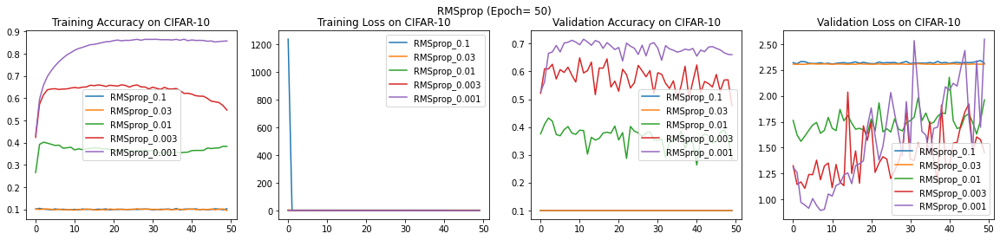

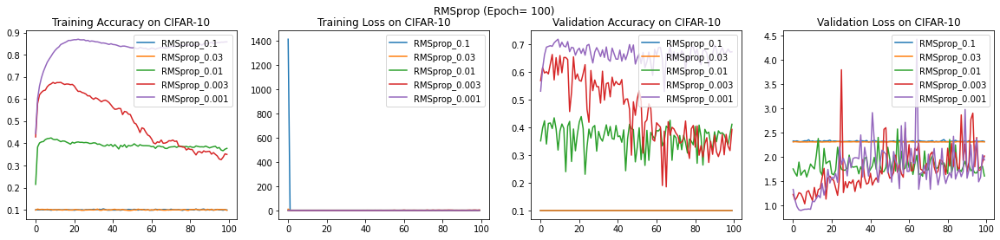

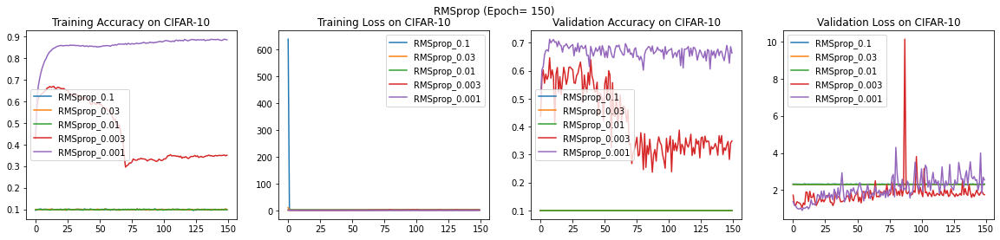

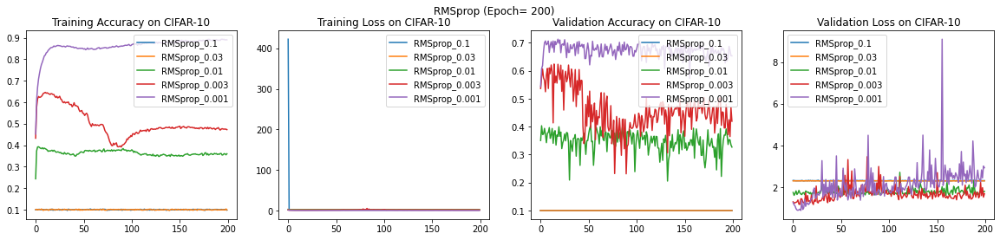

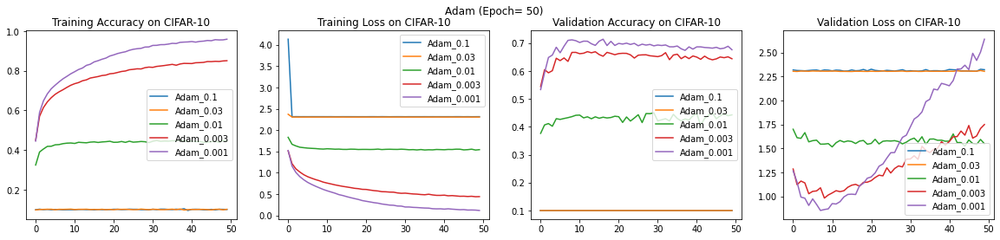

...

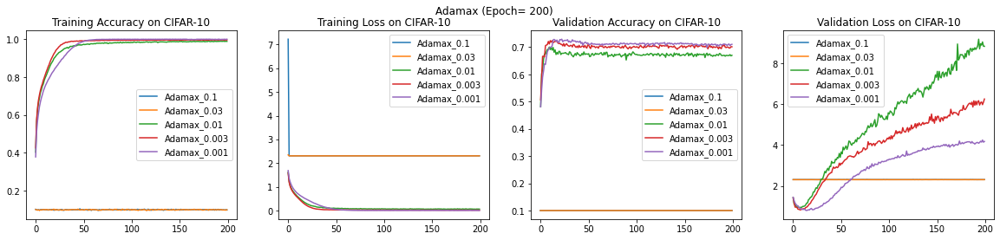

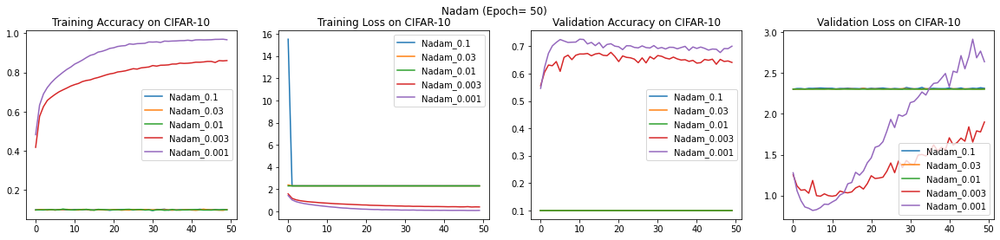

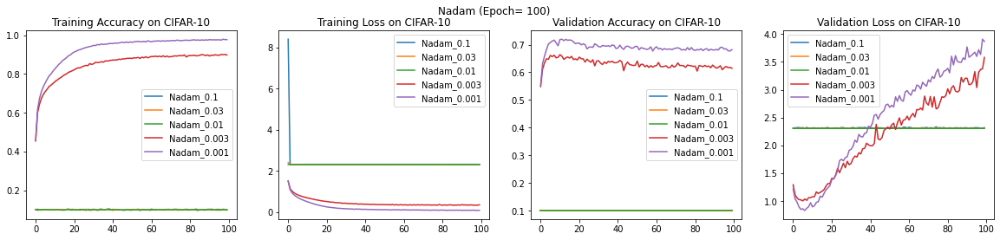

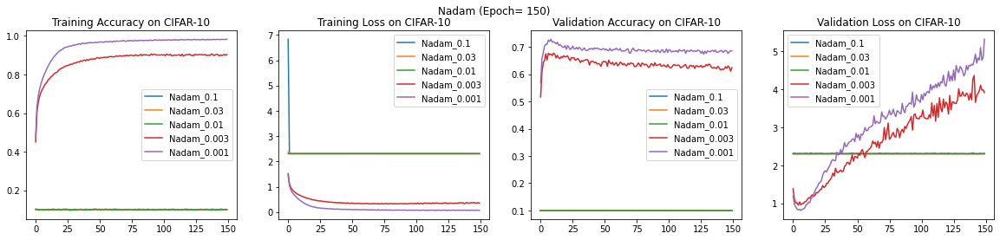

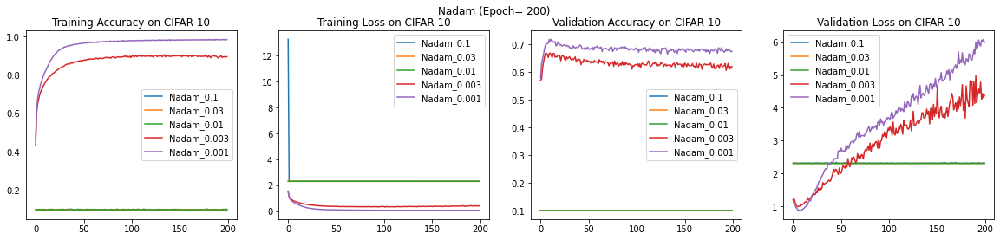

In [4]:
optimizers = ['RMSprop', 'Adam', 'SGD', 'Adagrad', 'Adadelta', 'Adamax', 'Nadam']
learning_rates = [0.1, 0.03, 0.01, 0.003, 0.001]
epochs = [50, 100, 150, 200]
for optimizer in optimizers:
    for epoch in epochs:
        plotLearningRateC([optimizer], learning_rates, epoch)


# Density

In [3]:
%matplotlib inline
import matplotlib.pylab as plt
import numpy as np
import json
import pandas as pd

In [ ]:
optimizers = ['RMSprop', 'Adam', 'SGD', 'Adagrad', 'Adadelta', 'Adamax', 'Nadam']
learning_rates = [0.1, 0.03, 0.01, 0.003, 0.001]
epochs = [50, 100, 150, 200]

# MNIST

In [7]:
def buildMNISTData( optimizers = ['RMSprop', 'Adam', 'SGD', 'Adagrad', 'Adadelta', 'Adamax', 'Nadam'], 
                    learning_rates = ['0.1','0.03', '0.01', '0.003', '0.001'], 
                    epochs = ['50', '100', '150', '200']):
    opt_dict = {}
    for optimizer in optimizers:
        for lr in learning_rates:
            for epoch in epochs:
                key = "{opt}_{lr}_{epoch}".format(opt=optimizer,lr=lr,epoch=epoch)
                opt_dict[key] = pd.read_json("output/MNIST/{opt}_{lr}_{epoch}_history.json".format(opt=optimizer,lr=lr,epoch=epoch))
    return opt_dict

In [8]:
mnist = buildMNISTData()

In [10]:
mnist_df = pd.DataFrame(mnist)

ValueError: If using all scalar values, you must pass an index

In [31]:
mnist['Nadam_0.1_200']

,loss,accuracy,val_loss,val_accuracy
0,1.050142,0.65386,1.093529,0.6716
1,0.844348,0.75428,0.785994,0.7795
2,0.903769,0.74182,1.091158,0.7259
3,0.940185,0.73306,1.346859,0.5571
4,1.046278,0.66726,0.985703,0.7027
...,...,...,...,...
195,1.591791,0.29636,2.045604,0.2872
196,1.589296,0.29602,1.813030,0.2989
197,1.596979,0.29346,1.613044,0.2835
198,1.611691,0.29300,1.733669,0.2991


In [17]:
import seaborn as sns

In [33]:
temp = [x for x in range(0,200,1)]

In [84]:
ax = sns.displot(y='accuracy',x=yaxis, data=mnist['Adam_0.001_200'], bins=20, cbar=True)
ax.set(ylabel='Accuracy', xlabel='Epochs (Bin size=20)')
plt.show()


ValueError: Length of list vectors must match length of `data` when both are used, but `data` has length 200 and the vector passed to `x` has length 400.

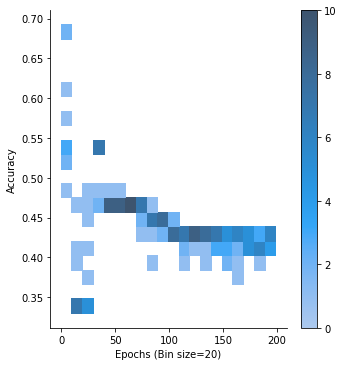

In [58]:
ax = sns.displot(y='accuracy',x=temp, data=mnist['RMSprop_0.1_200'], bins=20, cbar=True)
ax.set(ylabel='Accuracy', xlabel='Epochs (Bin size=20)')
plt.show()

In [59]:
df = mnist['Nadam_0.1_200']

In [61]:
df['lr'] = 0.1

In [105]:
df[:20].to_csv("rehan.csv")

In [85]:
temp = mnist['Nadam_0.03_200']

In [93]:
temp[-1:]

,loss,accuracy,val_loss,val_accuracy,lr
199,0.145476,0.96534,2.787582,0.9488,0.03


In [64]:
temp['lr'] = 0.03

In [65]:
temp

,loss,accuracy,val_loss,val_accuracy,lr
0,0.330854,0.90216,0.444653,0.8988,0.03
1,0.235588,0.93640,0.217860,0.9455,0.03
2,0.203584,0.94576,0.222706,0.9489,0.03
3,0.184552,0.95040,0.191030,0.9522,0.03
4,0.184063,0.95264,0.230967,0.9457,0.03
...,...,...,...,...,...
195,0.153945,0.96164,2.169816,0.9397,0.03
196,0.183427,0.95794,1.530146,0.9319,0.03
197,0.148009,0.96200,1.909062,0.9417,0.03
198,0.163127,0.95856,1.843630,0.9358,0.03


In [67]:
df = pd.concat([df, temp])

In [71]:
df.lr.value_counts()

0.10    200
0.03    200
Name: lr, dtype: int64

In [74]:
yaxis = [x for x in range(0,400,1)]

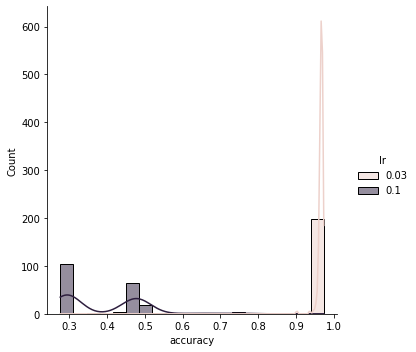

In [81]:
ax = sns.displot(x='accuracy', data=df, bins=20,hue='lr', kde=True)
#ax.set(ylabel='Accuracy', xlabel='Epochs (Bin size=20)')
plt.show()

In [94]:
l = [x for x in range(0.1,0.001, -0.01)]

TypeError: 'float' object cannot be interpreted as an integer

In [103]:
linspace(0.001, 0.1, num = 100, endpoint =True).tolist()

[0.001,
 0.002,
 0.003,
 0.004,
 0.005,
 0.006,
 0.007,
 0.008,
 0.009000000000000001,
 0.010000000000000002,
 0.011,
 0.012,
 0.013000000000000001,
 0.014000000000000002,
 0.015,
 0.016,
 0.017,
 0.018000000000000002,
 0.019000000000000003,
 0.02,
 0.021,
 0.022000000000000002,
 0.023,
 0.024,
 0.025,
 0.026000000000000002,
 0.027000000000000003,
 0.028,
 0.029,
 0.030000000000000002,
 0.031,
 0.032,
 0.033,
 0.034,
 0.035,
 0.036000000000000004,
 0.037000000000000005,
 0.038,
 0.039,
 0.04,
 0.041,
 0.042,
 0.043000000000000003,
 0.044000000000000004,
 0.045,
 0.046,
 0.047,
 0.048,
 0.049,
 0.05,
 0.051000000000000004,
 0.052000000000000005,
 0.053000000000000005,
 0.054,
 0.055,
 0.056,
 0.057,
 0.058,
 0.059000000000000004,
 0.060000000000000005,
 0.061,
 0.062,
 0.063,
 0.064,
 0.065,
 0.066,
 0.067,
 0.068,
 0.069,
 0.07,
 0.07100000000000001,
 0.07200000000000001,
 0.07300000000000001,
 0.074,
 0.075,
 0.076,
 0.077,
 0.078,
 0.079,
 0.08,
 0.081,
 0.082,
 0.083,
 0.084,
 0.085

In [96]:
from numpy import arange,linspace

---
# Experiment Backup

---

In [ ]:
opt_dict = {
    "SGD_0.1_10": SGD_1_10, 
    "SGD_0.01_10": SGD_01_10, 
    "SGD_0.001_10": SGD_001_10
    }
opts = ["SGD_0.1_10", "SGD_0.01_10", "SGD_0.001_10"]

plt.figure(figsize=(20,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    key = ['loss', 'accuracy', 'val_loss', 'val_accuracy'][i]
    title = ['Training Accuracy on MNIST', 'Validation Accuracy on MNIST', 'Training Loss on MNIST', 'Validation Loss on MNIST'][i]
    for opt in opts:
        plt.plot(range(10), opt_dict[opt][key], label=opt)
    plt.legend()
    plt.title(title)
plt.plot()

## Learning Rate Consistancy

In [ ]:
def buildOptimizationDictLS(optimizers, learning_rates, epoch):
    opt_dict = {}
    for optimizer in optimizers:
        for lr in learning_rates:
            key = "{opt}_{lr}_{epoch}".format(opt=optimizer,lr=lr,epoch=epoch)
            opt_dict[key] = pd.read_json("output/{opt}_{lr}_{epoch}_history.json".format(opt=optimizer,lr=lr,epoch=epoch))
    return opt_dict

def plotLearningRateSensitivity(optimizers, learning_rates, epoch):
    opt_dict = buildOptimizationDictLS(optimizers, learning_rates, epoch)
    plt.figure(figsize=(20,4))
    for i in range(4):
        plt.subplot(1,4,i+1)
        key = ['loss', 'accuracy', 'val_loss', 'val_accuracy'][i]
        title = ['Training Accuracy on MNIST', 'Validation Accuracy on MNIST', 'Training Loss on MNIST', 'Validation Loss on MNIST'][i]
        for opt in list(opt_dict.keys()):
            plt.plot(range(epoch), opt_dict[opt][key], label=opt)
        plt.legend()
        plt.title(title)
    plt.plot()


# ------------------
# Main Function
# ------------------

if __name__ == '__main__':

    optimizers = ["SGD"]
    
    learning_rates = [0.1, 0.03, 0.01, 0.003, 0.001]

    epochs = [20, 60, 100] # Genarates multiple graphs

    for epoch in epochs:
        plotLearningRateSensitivity(optimizers, learning_rates, epoch)